In [515]:
#Importando as bibliotecas para o estudo
import os
import six
import pydot
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scikitplot as skplt

from six.moves import urllib
from scipy.stats import skew, kurtosis, mode
from IPython import display
from IPython.display import Image
from IPython.display import SVG
from graphviz import Digraph
from xgboost import XGBClassifier
from xgboost import plot_tree

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier, ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor, GradientBoostingClassifier, AdaBoostRegressor
from sklearn import tree
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import export_graphviz
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import roc_auc_score

np.random.seed(seed=2019)

In [516]:
df = pd.read_csv("Base de dados v7.csv", delimiter =';')

In [517]:
df.head()

,id,quadro,especialidade,posto,salario,localidade_especial,nivel,idade,situacao,genero,estado_civil,escolaridade,ano_turma,tempo_servico,motivo_inatividade
0,1,4,4.10,1,650.24,0,5,27,INATIVO,FEMININO,SOLTEIRO(A),ENSINO SUPERIOR COMPLETO,2009,0.39,NÃO PLANEJADA
1,2,2,2.12,5,551.50,0,3,24,INATIVO,MASCULINO,SOLTEIRO(A),ENSINO SUPERIOR COMPLETO,1996,0.19,NÃO PLANEJADA
2,3,2,2.12,5,551.50,0,3,25,INATIVO,MASCULINO,SOLTEIRO(A),ENSINO SUPERIOR COMPLETO,1996,0.19,NÃO PLANEJADA
3,4,5,5.20,1,650.24,0,4,25,INATIVO,MASCULINO,SOLTEIRO(A),ENSINO SUPERIOR COMPLETO,2007,4.05,NÃO PLANEJADA
4,5,3,0.00,1,650.24,1,4,29,INATIVO,MASCULINO,SOLTEIRO(A),ENSINO SUPERIOR COMPLETO,2006,9.19,NÃO PLANEJADA


In [518]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10623 entries, 0 to 10622
Data columns (total 15 columns):
id                     10623 non-null int64
quadro                 10623 non-null int64
especialidade          10623 non-null float64
posto                  10623 non-null int64
salario                10623 non-null float64
localidade_especial    10623 non-null int64
nivel                  10623 non-null int64
idade                  10623 non-null int64
situacao               10623 non-null object
genero                 10623 non-null object
estado_civil           10623 non-null object
escolaridade           10623 non-null object
ano_turma              10623 non-null int64
tempo_servico          10623 non-null float64
motivo_inatividade     2857 non-null object
dtypes: float64(3), int64(7), object(5)
memory usage: 1.2+ MB


In [519]:
df.isnull().sum()

id                        0
quadro                    0
especialidade             0
posto                     0
salario                   0
localidade_especial       0
nivel                     0
idade                     0
situacao                  0
genero                    0
estado_civil              0
escolaridade              0
ano_turma                 0
tempo_servico             0
motivo_inatividade     7766
dtype: int64

In [520]:
# Transformar texto em número
#df['quadro_sigla'] = df['quadro_sigla'].astype('category').cat.codes

for col in df.columns:
    if df[col].dtype == 'object':
        df[col] = df[col].astype('category').cat.codes
        
#df['situacao'] = df['situacao'].astype('category').cat.codes
#df['genero'] = df['genero'].astype('category').cat.codes
#df['motivo_inatividade'] = df['motivo_inatividade'].astype('category').cat.codes

In [521]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10623 entries, 0 to 10622
Data columns (total 15 columns):
id                     10623 non-null int64
quadro                 10623 non-null int64
especialidade          10623 non-null float64
posto                  10623 non-null int64
salario                10623 non-null float64
localidade_especial    10623 non-null int64
nivel                  10623 non-null int64
idade                  10623 non-null int64
situacao               10623 non-null int8
genero                 10623 non-null int8
estado_civil           10623 non-null int8
escolaridade           10623 non-null int8
ano_turma              10623 non-null int64
tempo_servico          10623 non-null float64
motivo_inatividade     10623 non-null int8
dtypes: float64(3), int64(7), int8(5)
memory usage: 881.9 KB


In [522]:
df.head()

,id,quadro,especialidade,posto,salario,localidade_especial,nivel,idade,situacao,genero,estado_civil,escolaridade,ano_turma,tempo_servico,motivo_inatividade
0,1,4,4.10,1,650.24,0,5,27,1,0,5,6,2009,0.39,0
1,2,2,2.12,5,551.50,0,3,24,1,1,5,6,1996,0.19,0
2,3,2,2.12,5,551.50,0,3,25,1,1,5,6,1996,0.19,0
3,4,5,5.20,1,650.24,0,4,25,1,1,5,6,2007,4.05,0
4,5,3,0.00,1,650.24,1,4,29,1,1,5,6,2006,9.19,0


In [523]:
# Retirando a coluna id
df = df.drop('id',axis=1)

In [524]:
df.head()

,quadro,especialidade,posto,salario,localidade_especial,nivel,idade,situacao,genero,estado_civil,escolaridade,ano_turma,tempo_servico,motivo_inatividade
0,4,4.10,1,650.24,0,5,27,1,0,5,6,2009,0.39,0
1,2,2.12,5,551.50,0,3,24,1,1,5,6,1996,0.19,0
2,2,2.12,5,551.50,0,3,25,1,1,5,6,1996,0.19,0
3,5,5.20,1,650.24,0,4,25,1,1,5,6,2007,4.05,0
4,3,0.00,1,650.24,1,4,29,1,1,5,6,2006,9.19,0


In [525]:
# Separar os dataframes em inativos e ativos
df_inativo, df_ativo = df[df['situacao'] == 1], df[df['situacao'] != 1]

# Verificando o tanho dos DataFrames
df_inativo.shape, df_ativo.shape

((2857, 14), (7766, 14))

In [526]:
#Creando gráfico do quantitativo de militares por quadro
df_inat_p, df_inat_np = df_inativo[df_inativo['motivo_inatividade'] == 1], df_inativo[df_inativo['motivo_inatividade'] == 0]
pivot1 = pd.pivot_table(df_inat_np,values="situacao",index=["quadro"],aggfunc=np.sum)

In [527]:
df_inat_np.head()

,quadro,especialidade,posto,salario,localidade_especial,nivel,idade,situacao,genero,estado_civil,escolaridade,ano_turma,tempo_servico,motivo_inatividade
0,4,4.10,1,650.24,0,5,27,1,0,5,6,2009,0.39,0
1,2,2.12,5,551.50,0,3,24,1,1,5,6,1996,0.19,0
2,2,2.12,5,551.50,0,3,25,1,1,5,6,1996,0.19,0
3,5,5.20,1,650.24,0,4,25,1,1,5,6,2007,4.05,0
4,3,0.00,1,650.24,1,4,29,1,1,5,6,2006,9.19,0


Text(0.5, 1.0, 'Exódo por Quadro')

<Figure size 1080x432 with 0 Axes>

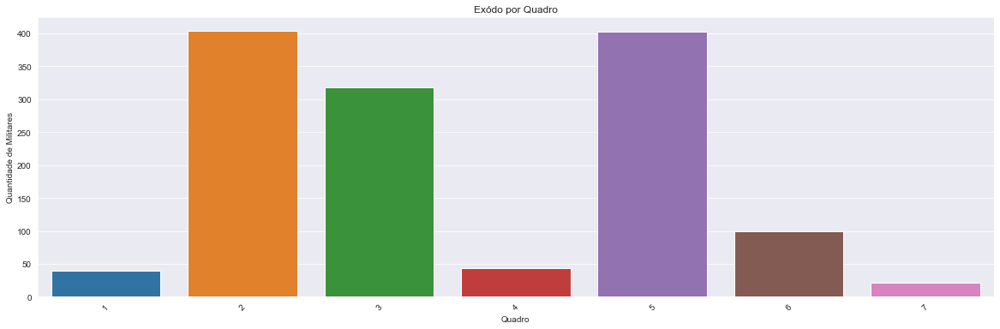

In [528]:
#Plotting the graph
plt.figure(figsize=(15, 6))
sns.set_style("darkgrid")
plt.figure(figsize=(20, 6))
ax = sns.barplot(x=pivot1.index, y="situacao", data=pivot1)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
plt.xlabel("Quadro")
plt.ylabel("Quantidade de Militares")
plt.title("Exódo por Quadro")

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\categorical.py:3666: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


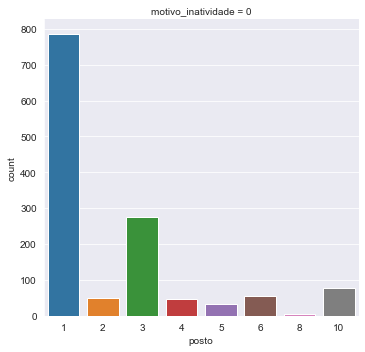

In [529]:
sns.factorplot(x='posto', col='motivo_inatividade', kind='count', data=df_inat_np);

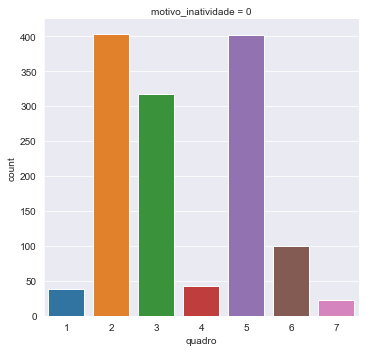

In [530]:
sns.factorplot(x='quadro', col='motivo_inatividade', kind='count', data=df_inat_np);

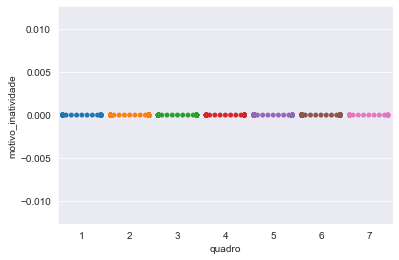

In [531]:
sns.swarmplot(x='quadro', y='motivo_inatividade', data=df_inat_np);

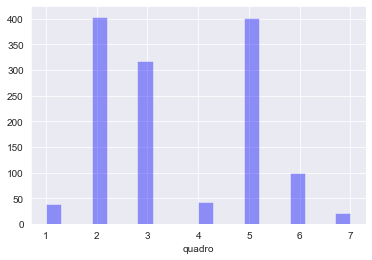

In [532]:
sns.distplot(df_inat_np['quadro'],kde=False,bins=20,color='blue')

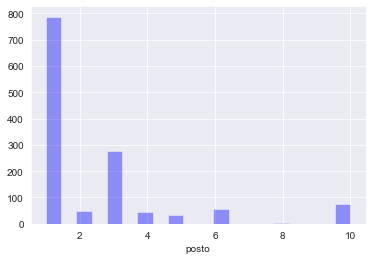

In [533]:
sns.distplot(df_inat_np['posto'],kde=False,bins=20,color='blue')

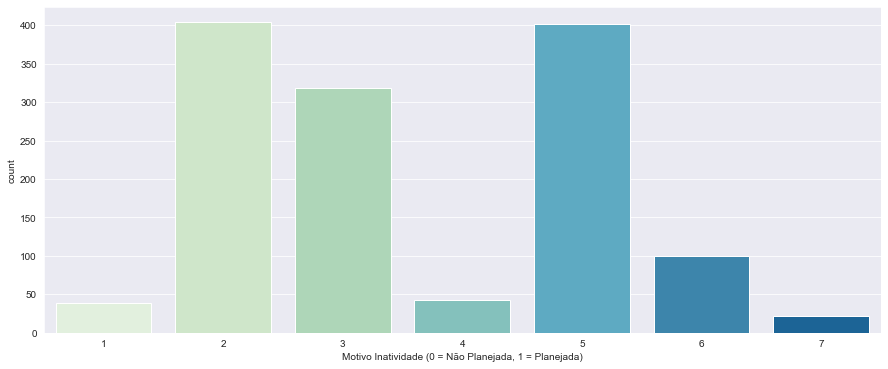

In [534]:
plt.figure(figsize=(15,6))
sns.countplot(x='quadro',data = df_inat_np, palette='GnBu')
plt.xlabel('Motivo Inatividade (0 = Não Planejada, 1 = Planejada)')
plt.show()

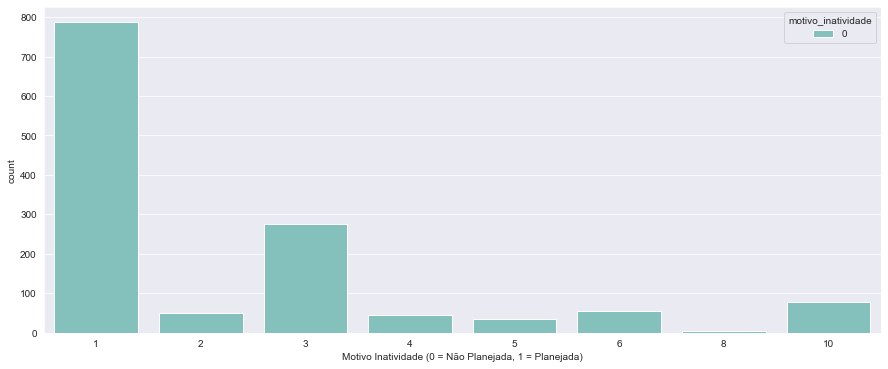

In [535]:
plt.figure(figsize=(15,6))
sns.countplot(x='posto',data = df_inat_np, hue = 'motivo_inatividade',palette='GnBu')
plt.xlabel('Motivo Inatividade (0 = Não Planejada, 1 = Planejada)')
plt.show()

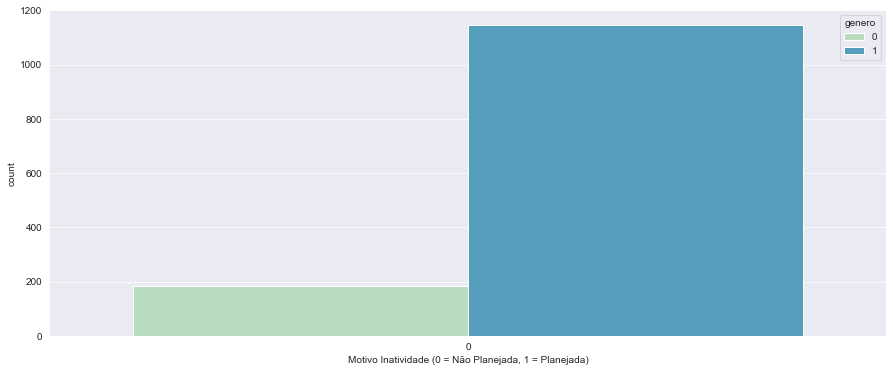

In [536]:
plt.figure(figsize=(15,6))
sns.countplot(x='motivo_inatividade',data = df_inat_np, hue = 'genero',palette='GnBu')
plt.xlabel('Motivo Inatividade (0 = Não Planejada, 1 = Planejada)')
plt.show()

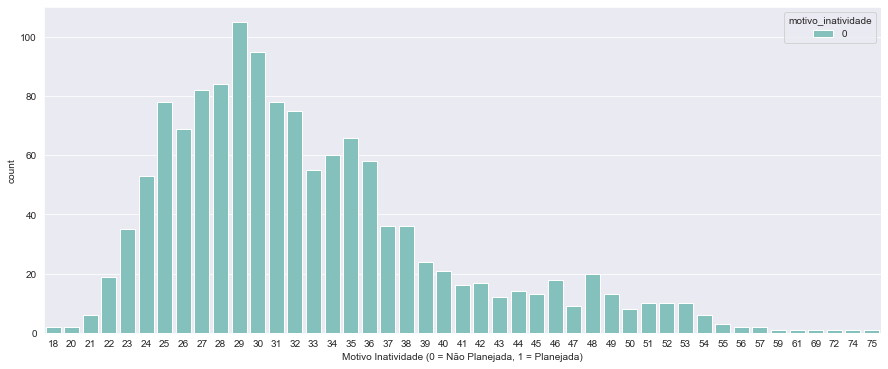

In [537]:
plt.figure(figsize=(15,6))
sns.countplot(x='idade',data = df_inat_np, hue = 'motivo_inatividade',palette='GnBu')
plt.xlabel('Motivo Inatividade (0 = Não Planejada, 1 = Planejada)')
plt.show()

In [538]:
# Correlação
df.corr()

,quadro,especialidade,posto,salario,localidade_especial,nivel,idade,situacao,genero,estado_civil,escolaridade,ano_turma,tempo_servico,motivo_inatividade
quadro,1.000000,0.315257,-0.044079,-0.022063,-0.129639,0.061442,-0.079216,-0.013304,-0.099898,0.039712,0.040224,0.036479,-0.024938,-0.023360
especialidade,0.315257,1.000000,-0.169961,-0.127062,-0.265713,0.089386,0.089786,0.150679,-0.209116,0.022464,0.124095,0.006535,-0.256262,0.087829
posto,-0.044079,-0.169961,1.000000,0.433012,-0.047435,-0.107607,0.229389,-0.108669,0.054979,-0.126780,0.020804,-0.158092,0.303605,-0.057417
salario,-0.022063,-0.127062,0.433012,1.000000,-0.351005,-0.186843,0.844139,0.174089,0.133329,-0.466903,0.272231,-0.719432,0.890278,0.317840
localidade_especial,-0.129639,-0.265713,-0.047435,-0.351005,1.000000,0.280893,-0.429991,-0.175581,0.173053,0.220919,-0.203191,0.321397,-0.229455,-0.202684
nivel,0.061442,0.089386,-0.107607,-0.186843,0.280893,1.000000,-0.116627,0.194129,-0.037571,0.085813,-0.053472,0.072945,-0.153095,0.218781
idade,-0.079216,0.089786,0.229389,0.844139,-0.429991,-0.116627,1.000000,0.253744,0.017501,-0.454893,0.301049,-0.745338,0.809899,0.399255
situacao,-0.013304,0.150679,-0.108669,0.174089,-0.175581,0.194129,0.253744,1.000000,0.143842,0.029655,0.045006,-0.643798,0.216138,0.934790
genero,-0.099898,-0.209116,0.054979,0.133329,0.173053,-0.037571,0.017501,0.143842,1.000000,-0.030479,-0.082597,-0.207894,0.236188,0.163157
estado_civil,0.039712,0.022464,-0.126780,-0.466903,0.220919,0.085813,-0.454893,0.029655,-0.030479,1.000000,-0.209848,0.258512,-0.432038,-0.067394


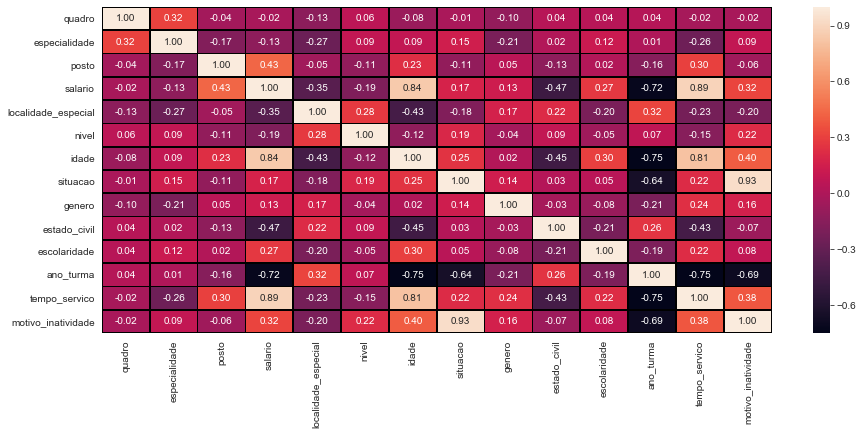

In [539]:
# Vamos plotar as correlações
f,ax = plt.subplots(figsize=(15,6))
sns.heatmap(df.corr(), annot=True, fmt='.2f', ax=ax, linecolor='black', lw=.7)

# Estatística Preditiva

In [540]:
# Selecionando os modelos a serem testados
models = {'RandomForest': RandomForestRegressor(random_state=42),
          'ExtraTrees': ExtraTreesRegressor(random_state=42),
          'GradientBoosting': GradientBoostingRegressor(random_state=42),
          'DecisionTree': DecisionTreeRegressor(random_state=42),
          'AdaBoost': AdaBoostRegressor(random_state=42),
          'KNN 1': KNeighborsRegressor(n_neighbors=1),
          'KNN 3': KNeighborsRegressor(n_neighbors=3),
          'KNN 11': KNeighborsRegressor(n_neighbors=11),
          'SVR': SVR(),
          'Linear Regression': LinearRegression()}

In [541]:
# Criando a função para execução dos modelos
def run_model(model, train, valid, feats, y_name):
    model.fit(train[feats], train[y_name])
    preds = model.predict(test[feats])
    return accuracy_score(test[y_name], preds.round())

## Predizendo a Situação

In [589]:
# Visualizando as colunas do DataFrame
df.columns

Index(['quadro', 'especialidade', 'posto', 'salario', 'localidade_especial',
       'nivel', 'idade', 'situacao', 'genero', 'estado_civil', 'escolaridade',
       'ano_turma', 'tempo_servico', 'motivo_inatividade'],
      dtype='object')

In [543]:
# Treino e teste da situação
train_sit, test_sit = train_test_split(df, test_size=0.30, random_state=42)

# Verificando o tanho dos DataFrames
train_sit.shape, test_sit.shape

((7436, 14), (3187, 14))

In [544]:
# Selecionado as features
removed_cols = ['quadro','posto','localidade_especial','situacao','estado_civil',
                'motivo_inatividade']
feats_sit = [c for c in df.columns if c not in removed_cols]

In [545]:
# Executando os modelos para predizer a situação (ativo ou inativo)
scores = []
for name, model in models.items():
    score = run_model(model, train_sit, test_sit, feats_sit, 'situacao')
    scores.append(score)
    print(name, ':', score) 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForest : 0.9673659673659674
ExtraTrees : 0.9743589743589743
GradientBoosting : 0.9020979020979021
DecisionTree : 0.9813519813519813
AdaBoost : 0.7983682983682984
KNN 1 : 0.9755244755244755
KNN 3 : 0.9393939393939394
KNN 11 : 0.9137529137529138


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


SVR : 0.9545454545454546
Linear Regression : 0.7249417249417249


### Decision Tree para Predição da Situação

In [546]:
# Instanciando um objeto DecisionTree
dt_sit = DecisionTreeRegressor(random_state=42)

In [547]:
# Treinando o modelo para predizer a situação
dt_sit.fit(train_sit[feats_sit], train_sit['situacao'])

DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=42, splitter='best')

In [548]:
# Fazer previsões usando o modelo treinado
preds = dt_sit.predict(test_sit[feats_sit])

In [549]:
# Avaliando com relação aos dados de validação
accuracy_score(test_sit['situacao'], preds)

0.9723878255412614

In [550]:
# Plotando a Árvore de Decisão
export_graphviz(dt_sit, out_file='tree_sit.dot', 
                feature_names = train_sit[feats_sit].columns, 
                class_names = "situacao",
                rounded = True, proportion = False, precision = 2, filled = True)

In [551]:
!dot -Tpng tree_sit.dot -o tree_sit.png -Gdpi=600

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.320043 to fit


In [552]:
Image(filename = "tree_sit.png")

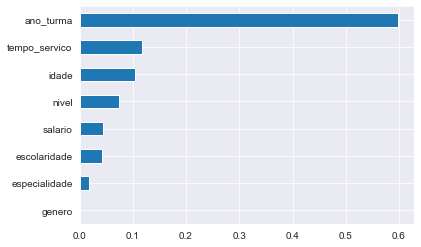

In [553]:
# Avaliando a importância das variaveis
pd.Series(dt_sit.feature_importances_, index=feats_sit).sort_values().plot.barh()

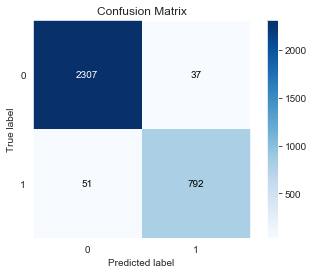

In [554]:
# Matriz de Confusão - Dados de validação
skplt.metrics.plot_confusion_matrix(test_sit['situacao'], preds)

### Random Forest para Predição da Situação

In [555]:
# Instanciando um objeto RandomForest
rf_sit = RandomForestClassifier(n_estimators=200, min_samples_split=5, max_depth=4,
                            random_state=42)

In [556]:
# Treinando o modelo para predizer a situação
rf_sit.fit(train_sit[feats_sit], train_sit['situacao'])

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=4, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [557]:
# Fazer previsões usando o modelo treinado
preds = rf_sit.predict(test_sit[feats_sit])

In [558]:
# Avaliando com relação aos dados de validação
accuracy_score(test_sit['situacao'], preds)

0.9112017571383747

In [559]:
# Plotando a Floresta Aleatória
export_graphviz(rf_sit.estimators_[4], out_file='forest_sit.dot', 
                feature_names = train_sit[feats_sit].columns, 
                class_names = "situacao",
                rounded = True, proportion = False, precision = 2, filled = True)

In [560]:
!dot -Tpng forest_sit.dot -o forest_sit.png -Gdpi=600

In [561]:
Image(filename = "forest_sit.png")

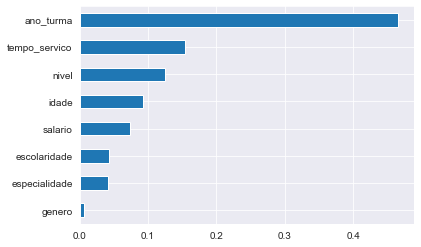

In [562]:
# Avaliando a importância das variaveis
pd.Series(rf_sit.feature_importances_, index=feats_sit).sort_values().plot.barh()

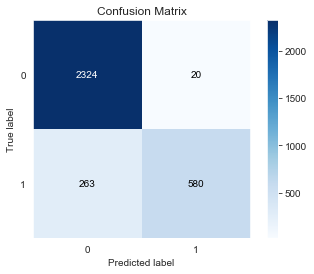

In [563]:
# Matriz de Confusão - Dados de validação
skplt.metrics.plot_confusion_matrix(test_sit['situacao'], preds)

## Predizendo o Motivo da Inatividade

In [590]:
# Visualizando as colunas do DataFrame
df.columns

Index(['quadro', 'especialidade', 'posto', 'salario', 'localidade_especial',
       'nivel', 'idade', 'situacao', 'genero', 'estado_civil', 'escolaridade',
       'ano_turma', 'tempo_servico', 'motivo_inatividade'],
      dtype='object')

In [591]:
# Treino e teste inativos
train_mot, test_mot = train_test_split(df_inativo, test_size=0.30, random_state=42)

# Verificando o tanho dos DataFrames
train_mot.shape, test_mot.shape

((1999, 14), (858, 14))

In [638]:
removed_cols = ['situacao', 'genero', 'motivo_inatividade']
feats_mot = [c for c in df.columns if c not in removed_cols]

In [639]:
# Executando os modelos
scores = []
for name, model in models.items():
    score = run_model(model, train_mot, test_mot, feats_mot, 'motivo_inatividade')
    scores.append(score)
    print(name, ':', score) 

RandomForest : 0.9289044289044289
ExtraTrees : 0.9265734265734266
GradientBoosting : 0.9370629370629371
DecisionTree : 0.9044289044289044
AdaBoost : 0.9277389277389277
KNN 1 : 0.9207459207459208
KNN 3 : 0.9289044289044289
KNN 11 : 0.9370629370629371


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


SVR : 0.916083916083916
Linear Regression : 0.9254079254079254


### Random Forest para Predição do Motivo de Inatividade

In [567]:
# Instanciando um objeto RandomForest
rf_mot = RandomForestClassifier(n_estimators=200, min_samples_split=5, max_depth=4,
                            random_state=42)

In [568]:
# Treinando o modelo para predizer o motivo da inatividade
rf_mot.fit(train_mot[feats_mot], train_mot['motivo_inatividade'])

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=4, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [569]:
# Fazer previsões usando o modelo treinado
preds = rf_mot.predict(test_mot[feats_mot])

In [570]:
# Avaliando com relação aos dados de validação
accuracy_score(test_mot['motivo_inatividade'], preds)

0.9324009324009324

In [571]:
# Plotando a Árvore de Decisão
export_graphviz(rf_mot.estimators_[4], out_file='tree_mot.dot', 
                feature_names = train_mot[feats_mot].columns, 
                class_names = "motivo_inatividade",
                rounded = True, proportion = False, precision = 2, filled = True)

In [572]:
!dot -Tpng tree_mot.dot -o tree_mot.png -Gdpi=600

In [573]:
Image(filename = "tree_mot.png")

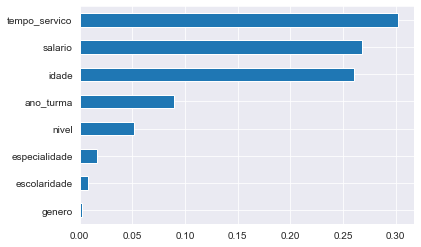

In [574]:
# Avaliando a importância das variaveis
pd.Series(rf_mot.feature_importances_, index=feats_mot).sort_values().plot.barh()

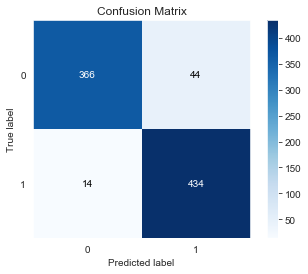

In [575]:
# Matriz de Confusão - Dados de validação
skplt.metrics.plot_confusion_matrix(test_mot['motivo_inatividade'], preds)

### Gradient Boosting para Predição do Motivo da Inatividade

In [576]:
# Instanciando um objeto GradientBoosting
gb_mot = XGBClassifier(n_estimators=200, learning_rate=1.0, max_depth=3, 
                    random_state=42)

In [577]:
# Treinando o modelo
gb_mot.fit(train_mot[feats_mot], train_mot['motivo_inatividade'])

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=1.0, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=200, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [578]:
# Fazer previsões usando o modelo treinado
preds = gb_mot.predict(test_mot[feats_mot])

In [579]:
# Avaliando com relação aos dados de validação
accuracy_score(test_mot['motivo_inatividade'], preds)

0.9254079254079254

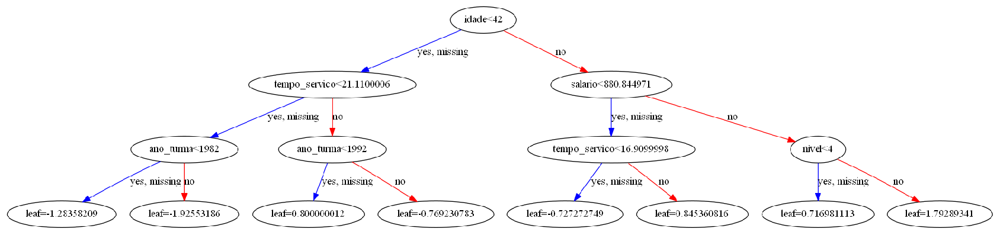

In [580]:
# Plotando o GradientBoosting
fig, ax = plt.subplots(figsize=(30, 30))
plot_tree(gb_mot, ax=ax)
plt.savefig("gb_mot.png")
plt.show()

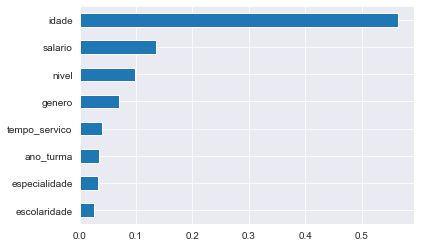

In [581]:
# Avaliando a importância das variaveis
pd.Series(gb_mot.feature_importances_, index=feats_mot).sort_values().plot.barh()

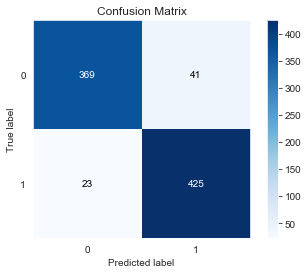

In [582]:
# Matriz de Confusão - Dados de validação
skplt.metrics.plot_confusion_matrix(test_mot["motivo_inatividade"], preds)

# Aplicando as Predições em Dados de Ativos (Atualmente)

In [583]:
df_pred = df_ativo.copy()
df_pred.shape

(7766, 14)

In [584]:
# Predizendo a situação dos atuais ativos, utilizando o modelo treinado de Árvore de Decisão
df_pred["situacao"] = dt_sit.predict(df_pred[feats_sit])

In [585]:
# Separar os dataframes em inativos e ativos
df_pred_inativo, df_pred_ativo = df_pred[df_pred['situacao'] == 1].copy(), df_pred[df_pred['situacao'] != 1].copy()

# Verificando o tanho dos DataFrames
df_pred_inativo.shape, df_pred_ativo.shape

((37, 14), (7729, 14))

In [586]:
# Predizendo o motivo da inatividade dos atuais ativos, preditos como inativos, 
# utilizando o modelo treinado de GradientBoosting
df_pred_inativo["motivo_inatividade"] = gb_mot.predict(df_pred_inativo[feats_mot])

In [587]:
# Concatenando as predições (situação e motivo_inatividade)
df_pred = pd.concat([df_pred_inativo,df_pred_ativo],ignore_index=True).copy()

In [588]:
# Exportando os resultados para o ETL no Pentaho
df_pred.to_csv('pred.csv', sep=";", index=False)